<h1>
<center>
DIP ASSIGNMENT-1 <br>
LOAY RASHID
2018102008
</center>
</h1>

In [2]:
import cv2
import numpy as np 
import plotly.express as px
import os
from google.colab.patches import cv2_imshow 
import matplotlib.pyplot as plt
%matplotlib inline
import math


#QUESTION 1: Chroma Keying
(a) Test your implementation using the provided foreground(fg.jpg) and background(bg.jpg).<br>
(b) Graft 007 (fg.jpg) onto Bond’s Skyfall mansion. Find this mansion’s image from the internet.

Text(0.5, 1.0, '1.1.b')

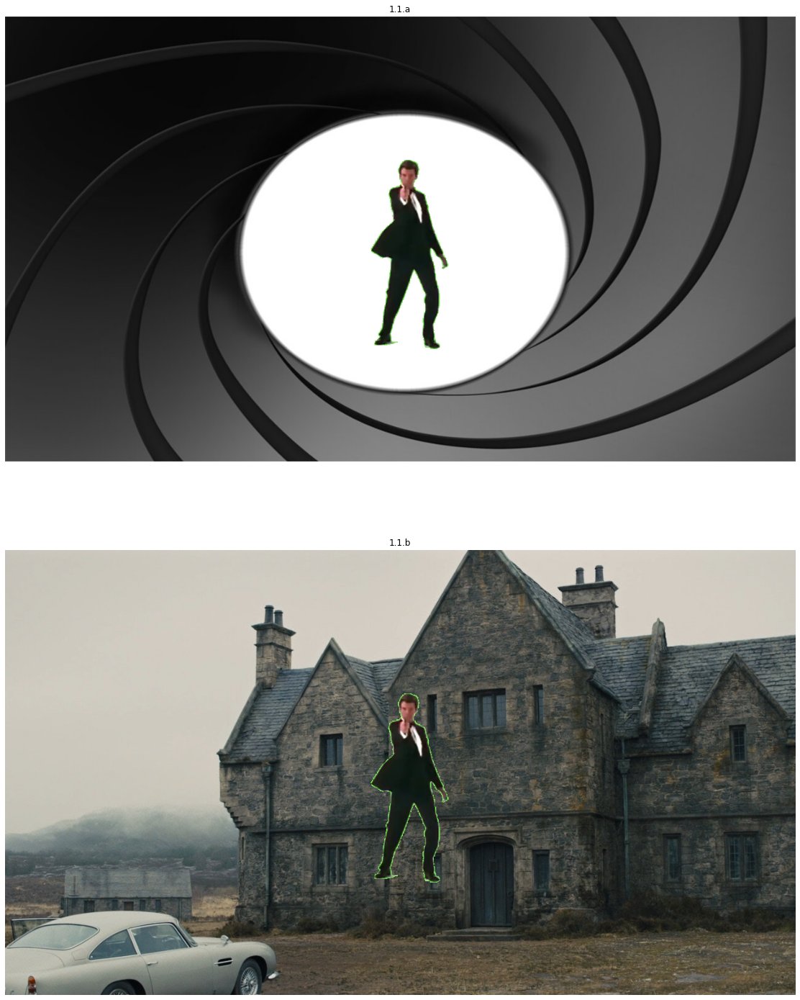

In [167]:
#QUESTION 1
#PART 1.a
fg = cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/fg.jpg") 
bg = cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/bg.jpg") 
lodge=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/Skyfall_Lodge.jpg")
timetostop=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/timetostop.jpg")
frank=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/frank.jpg")
#generate mask cutoffs
upper=np.array([136,255,82])
lower=np.array([36,205,0])

mask=np.copy(fg)
mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
mask=cv2.inRange(mask,lower,upper) #this is the mask we will use to do chroma keying

#remove fg background
finalfg=np.copy(fg)
finalfg[mask!=0]=[0,0,0]

#make hole in background
bg1=np.copy(bg)
bg1[mask==0]=[0,0,0]

#apply mask
final=bg1+finalfg

#cv2_imshow(final)
#cv2.imwrite('bond1.jpg',final)
#asdf=px.imshow(final)
#asdf.show()


#PART 1.b
clodge=lodge[0:720,0:1280]
clodge[mask==0]=[0,0,0]
final2=clodge+finalfg

final = cv2.cvtColor(final, cv2.COLOR_BGR2RGB)
final2 = cv2.cvtColor(final2, cv2.COLOR_BGR2RGB)
fig,sub= plt.subplots(2,1,figsize=(25,25))
sub[0].imshow(final)
sub[0].axis('off')
sub[0].set_title("1.1.a")

sub[1].imshow(final2)
sub[1].axis('off')
sub[1].set_title("1.1.b")

(c) Be creative and do the same procedure with a background image of your choice
with you in it! You can take any foreground green-screen image from the
internet.

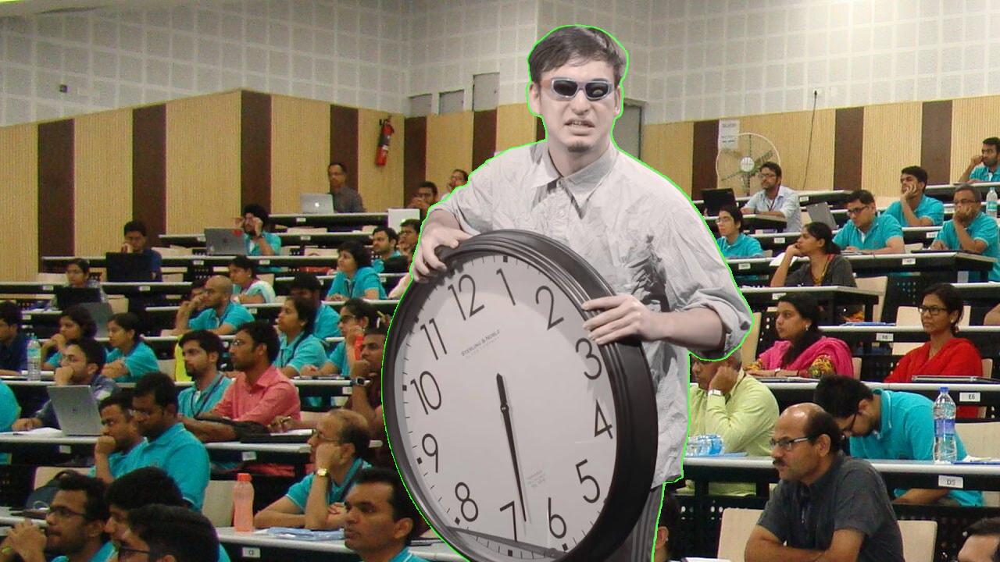

True

In [168]:
#PART 1.c
timetostop=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/timetostop.jpg")
frank=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/hilayacrop.jpg")
upper=np.array([62,255,71])
lower=np.array([0,204,0])

mask=np.copy(timetostop)
mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
mask=cv2.inRange(mask,lower,upper) #mask

ftimetostop=np.copy(timetostop)
ftimetostop[mask!=0]=[0,0,0]

face=frank[0:720,0:1280]
face[mask==0]=[0,0,0]

final3=face+ftimetostop
cv2_imshow(final3)
cv2.imwrite('final3.jpg',final3)

**Question 1, part 2:**

Given that the cloud size is of 4 GB and each image size is 1280 x 720,
- Each image pixel has 8 bits, and since the image has 3 channels, the image has 24 pixels for each bit. Total image size: (1280 x 720) x (24 bits) = 22118400 bits.
- 4GB = (4 x 1000 x 1000 x 1000) x 8 bits = 32000000000 bits.
- Total images you can store: 32000000000/22118400 = 1446 images.


#QUESTION 2


Image occupies 168.75 MB:
- Size of pixel of 3 channel RGB image = $3$ $bytes$
- $168.75$ MB = $168.75 * (1000 * 1000$ bytes) = $168750000$ bytes
- Number of pixels = $168750000/(3$ bytes per pixel) = $56250000$ pixels

$\sqrt[2]{56250000} = 7500$

Therefore it is a $7500*7500$ dimensional image.


#QUESTION 3



- Since the CCD sensor size is $ 10 * 10 $ mm and has a resolution of $ 1024 * 1024$ pixels
- Height of 50 pixels= $\frac{10*50}{1024}=0.48828125$ mm $=0.048828125$ cm

- Given focal length = $62.5$ mm
- $y = \frac{f*Y}{d}$. Here $y$ is length of image, $f$ is focal length, $Y$ is size of insignia, and $d$ is distance from insignia.
- $\frac{50}{1024} = \frac{6.25 * 32.8} {d}$ 
- Therefore, $d = \frac{6.25 * 32.8 * 1024}{50} = 4198.4$ cm 

$Therefore,$ $d = 4198.4$ cm



#QUESTION 4: Quantization of images, generating bitplanes, and reverse image corruption



####4.1, 4.2
Write a function bitQuantizeImage which takes an 8-bit image im and k, the
number of bits to which the image needs to be quantized to and returns the k-bit
quantized image. (10 points)
M wants an experienced hand to take this assignment, so prove yourself by running
the above function on 007 test1.jpg and find all possible quantization results (k=1
to k=8).

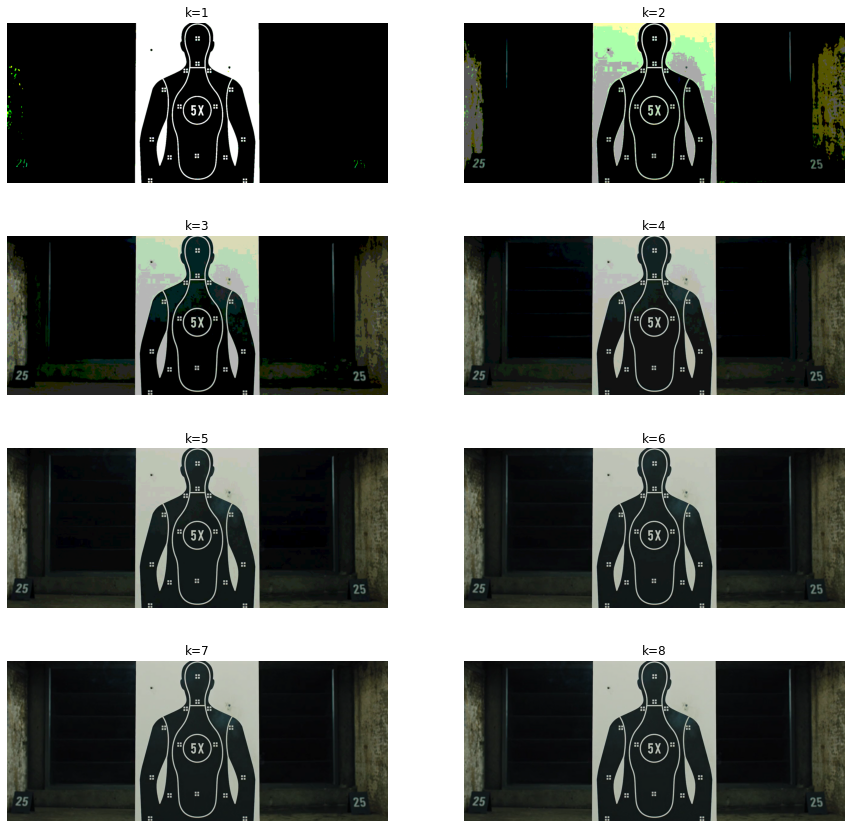

In [169]:
#QUESTION 4: IMAGE QUANTIZATION
def bitQuantizeImage(im,k):
  x=(im//2**(8-k)).astype(int)
  return (255*x // ((2**k)-1)) 

im=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/007_test1.png")
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

fig, sub = plt.subplots(4,2,figsize=(15,15))
k=1
for i in range(4):
  for j in range(2):
    im1=bitQuantizeImage(im,k)
    sub[i][j].imshow(im1)
    sub[i][j].axis('off')
    sub[i][j].set_title("k="+ str(k))
    k=k+1

####4.3
M is still not satisfied enough, so she commands you to show all the bit planes of
007 test2.jpg. Pass the test.


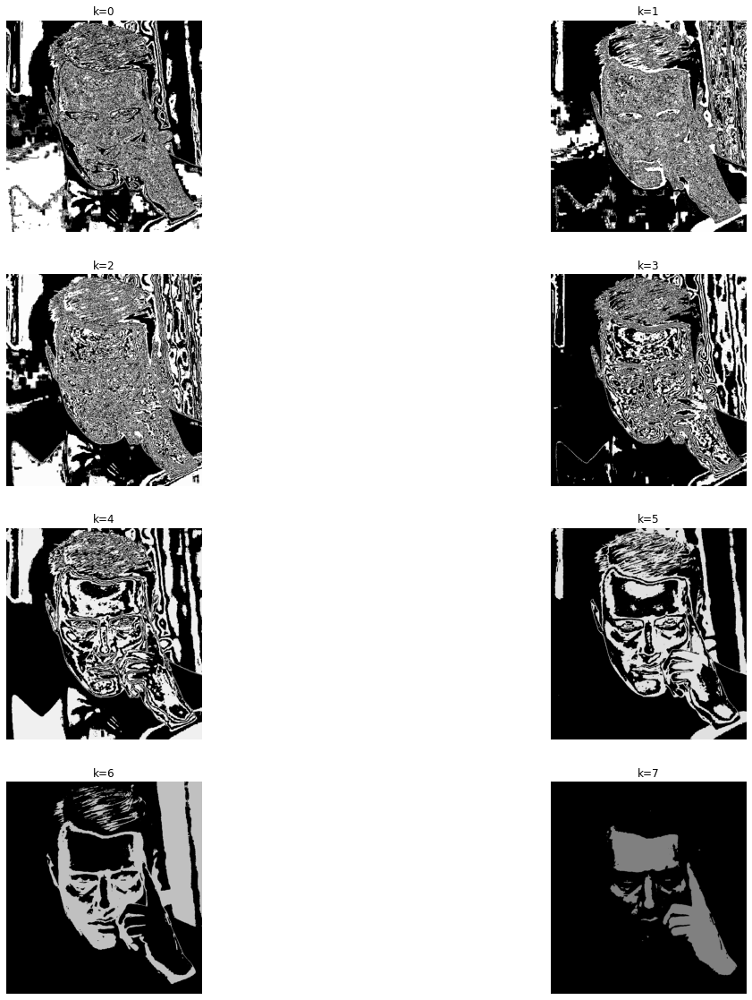

In [141]:
#QUESTION 4 PART3: BITPLANES
im=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/007_test2.png",0)

x, y = plt.subplots(4,2,figsize=(20,20))
k=0
for i in range(4):
  for j in range(2):
    #new numpy array for each bitplane
    bitp=np.full((im.shape[0], im.shape[1]),2**k,np.uint8)
    bitp=cv2.bitwise_and(bitp, im)
    #multiply ones (bit plane sliced) with 255 just for better visualization
    bit=255*bitp
    """
    bit=np.mod(im,2**k) #find bit using modulus operation
    bit=bit*( (2**(8-k)) -1)
    """
    y[i][j].imshow(bit, cmap='gray', vmin=0, vmax=255)
    y[i][j].axis('off')
    y[i][j].set_title("k="+ str(k))
    k=k+1

####4.4
Now that you have passed, you are declared fit for active duty. Help 007 guess the
corruption procedure for a target person’s image, person corrupt.jpg, using the
above functions. The correct images that you know for that corresponding person
from the database is represented by person.jpg

Text(0.5, 1.0, 'My Corrupted image')

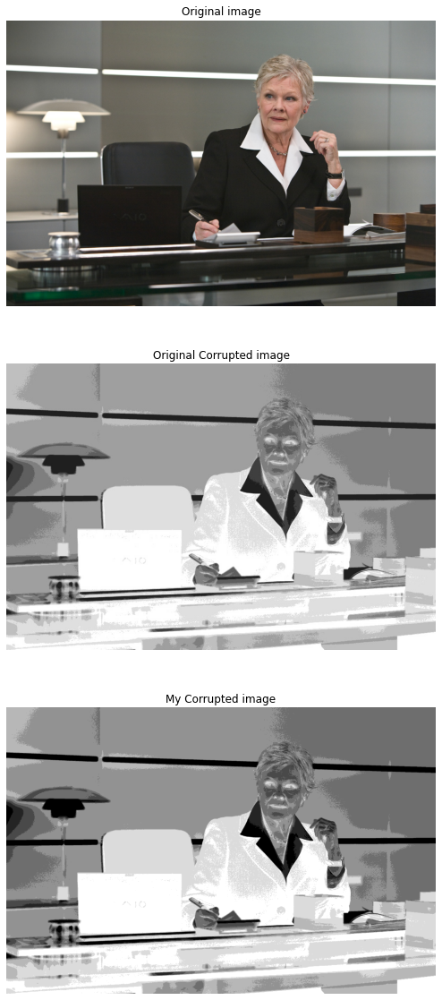

In [170]:
#QUESTON 4 PART 3: REVERSE CORRUPTION
#2018102008%5=3
#k=3; using m's image

def bitQuantizeImage(im,k):
  x=(im//2**(8-k)).astype(int)
  return (255*x // ((2**k)-1)) 

m=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/m.jpg")
mc=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/m_corrupt.jpg")

mtest=cv2.cvtColor(m, cv2.COLOR_BGR2GRAY)
mtest=bitQuantizeImage(mtest,3) #3 bit quantization
mtest=255*( 1-(mtest/255) ) #invert grayscale image

fig, sub=plt.subplots(3,1,figsize=(20,20))
m=cv2.cvtColor(m, cv2.COLOR_BGR2RGB)
sub[0].imshow(m)
sub[0].axis('off')
sub[0].set_title("Original image")

sub[1].imshow(mc)
sub[1].axis('off')
sub[1].set_title("Original Corrupted image")

sub[2].imshow(mtest,'gray')
sub[2].axis('off')
sub[2].set_title("My Corrupted image")



#QUESTION 5: Linear Contrast Stretching

Effectively, we have stretched the image's histogram to cover a larger (or smaller) set of intensities. This generally improves the contrast of the image, however it may also introduce some noise in the final result. 

Relevant formula:

$z=a_{min}+(a_{max}-a_{min})*\frac{a-a_{low} }{a_{high}-a_{low}}$



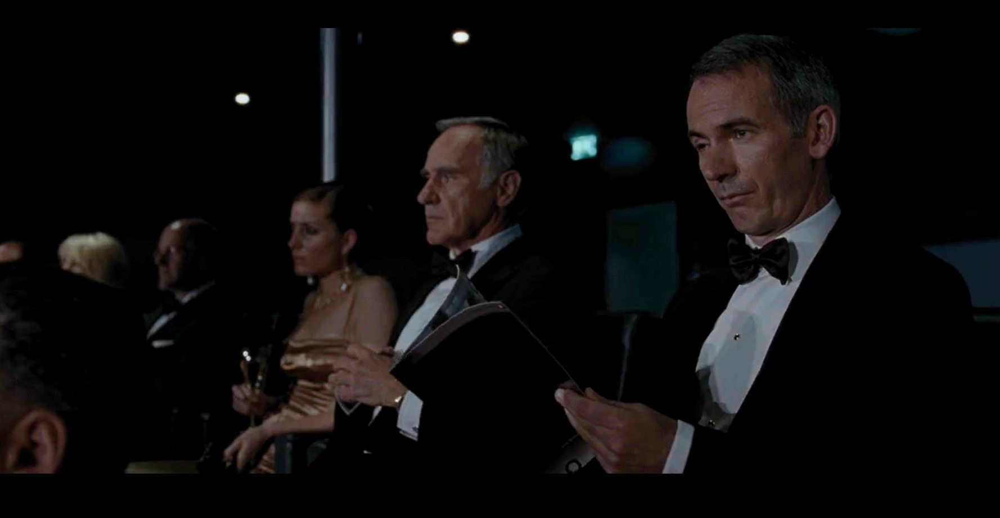

In [171]:
#QUESTION 5
def linContrastStretching(im,a,b):
  alow=np.amin(im)
  ahigh=np.amax(im)
  im = im.astype(np.float64)
  im1=((im-alow)*(b-a)*1.0/((ahigh-alow)*1.0))
  im1=np.round(im1)
  im1=im1+a
  return im1.astype(np.uint8)

bad=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/quantum_bad.jpg")
good=linContrastStretching(bad,0,255)
cv2_imshow(good)

#plt.hist(bad.ravel(),256,[0,256])
#plt.show()
#plt.hist(good.ravel(),256,[0,256])
#plt.show()


#QUESTION 6: Histogram Processing

Formula for creating histogram: 
$P_x(j) = \sum_{i=0}^{j} P_x(i)$ 
<br>
Formula to calculate cumulative sum:
$s_k = \sum_{j=0}^{k} \dfrac{n_j}{N}$

####Histogram Equalization

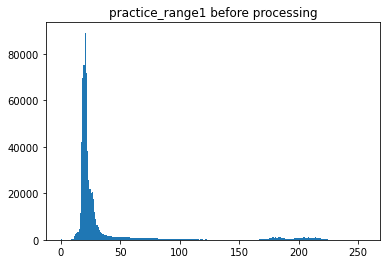

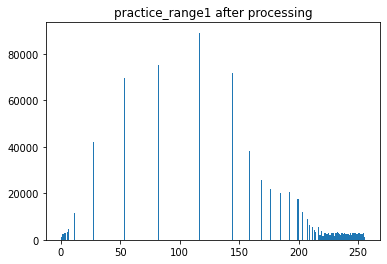

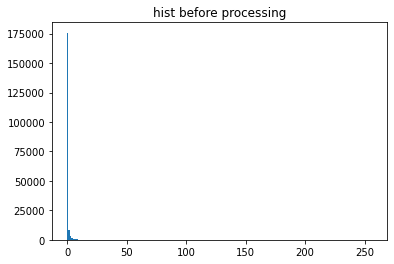

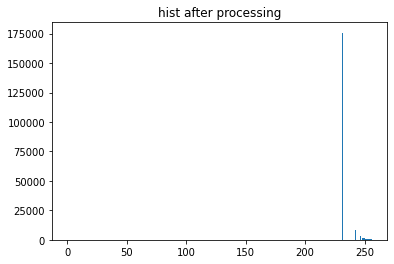

'\nfig1, sub1=plt.subplots(1,2)\nim = im.astype(np.uint8)\nhist1=cv2.calcHist(im,[0],None,[256],[0,256])\nsub1[0].hist(hist1.ravel(),256,[0,256]) \nsub1[0].set_title("practice_range1 before processing")\n\nhist2=cv2.calcHist([im1],[0],None,[256],[0,256])\n#sub1[1].plot(hist2)\nsub1[1].hist(hist2.ravel(),256,[0,256]) \nsub1[1].set_title("practice_range1 post processing")\nfig2, sub2=plt.subplots(1,2)\nhist1= cv2.calcHist([im2],[0],None,[256],[0,256])\n#hist1=plotHist(im2)\n#sub2[0].plot(hist1)\nsub2[0].hist(hist1.ravel(),256,[0,256]) \nsub2[0].set_title("hist before processing")\n\nhist2= cv2.calcHist([im3],[0],None,[256],[0,256])\n#hist2=plotHist(im3)\nsub2[1].hist(hist2.ravel(),256,[0,256]) \nsub2[1].set_title("hist post processing")\n'

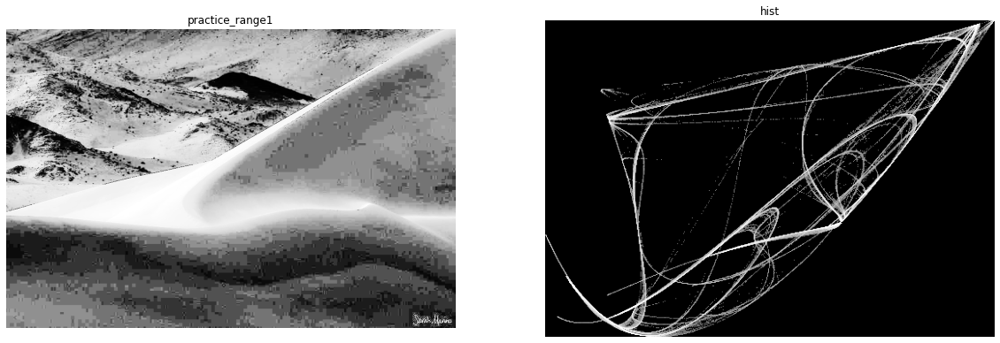

In [165]:
#QUESTION 6
def plotHist(im):
  hist=np.zeros(256)
  for i in range(256):
    hist[i]=(im<=i).sum()
  return hist

def histEqualization(im):
  cdf=np.zeros(256,dtype=int)
  for i in range(256):
    cdf[i]= ((im<=i).sum())
  cdf=cdf*1.0/(im.shape[0]*im.shape[1]*1.0) #normalize image
  im=im.astype(np.uint8) #convert to uint8
  im1=np.copy(im)
  im1 = np.round(255.0 * cdf[im]) #scale back upto 255
  im1=np.round(im1)
  im1=im1.astype(np.uint8)
  return im1

im=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/practice_range1.jpg",0)
im2=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/hist.jpg",0)
im = im.astype(np.float64)
im1=histEqualization(im)
im3=histEqualization(im2)
#cv2_imshow(im1)
#cv2_imshow(im3)

plot1=plt.figure(1)
plt.hist(im.ravel(),256,[0,256]) 
plt.title("practice_range1 before processing")
plot2=plt.figure(2)
plt.hist(im1.ravel(),256,[0,256]) 
plt.title("practice_range1 after processing")
plot3=plt.figure(3)
plt.hist(im2.ravel(),256,[0,256]) 
plt.title("hist before processing")
plot4=plt.figure(4)
plt.hist(im3.ravel(),256,[0,256]) 
plt.title("hist after processing")
plt.show()

fig, sub=plt.subplots(1,2,figsize=(20,20))
sub[0].imshow(im1,'gray')
sub[0].axis('off')
sub[0].set_title("practice_range1")

sub[1].imshow(im3,'gray')
sub[1].axis('off')
sub[1].set_title("hist")

"""
fig1, sub1=plt.subplots(1,2)
im = im.astype(np.uint8)
hist1=cv2.calcHist(im,[0],None,[256],[0,256])
sub1[0].hist(hist1.ravel(),256,[0,256]) 
sub1[0].set_title("practice_range1 before processing")

hist2=cv2.calcHist([im1],[0],None,[256],[0,256])
#sub1[1].plot(hist2)
sub1[1].hist(hist2.ravel(),256,[0,256]) 
sub1[1].set_title("practice_range1 post processing")
fig2, sub2=plt.subplots(1,2)
hist1= cv2.calcHist([im2],[0],None,[256],[0,256])
#hist1=plotHist(im2)
#sub2[0].plot(hist1)
sub2[0].hist(hist1.ravel(),256,[0,256]) 
sub2[0].set_title("hist before processing")

hist2= cv2.calcHist([im3],[0],None,[256],[0,256])
#hist2=plotHist(im3)
sub2[1].hist(hist2.ravel(),256,[0,256]) 
sub2[1].set_title("hist post processing")
"""
#cv2.imwrite('equalize.jpg',im1)



####Histogram Matching

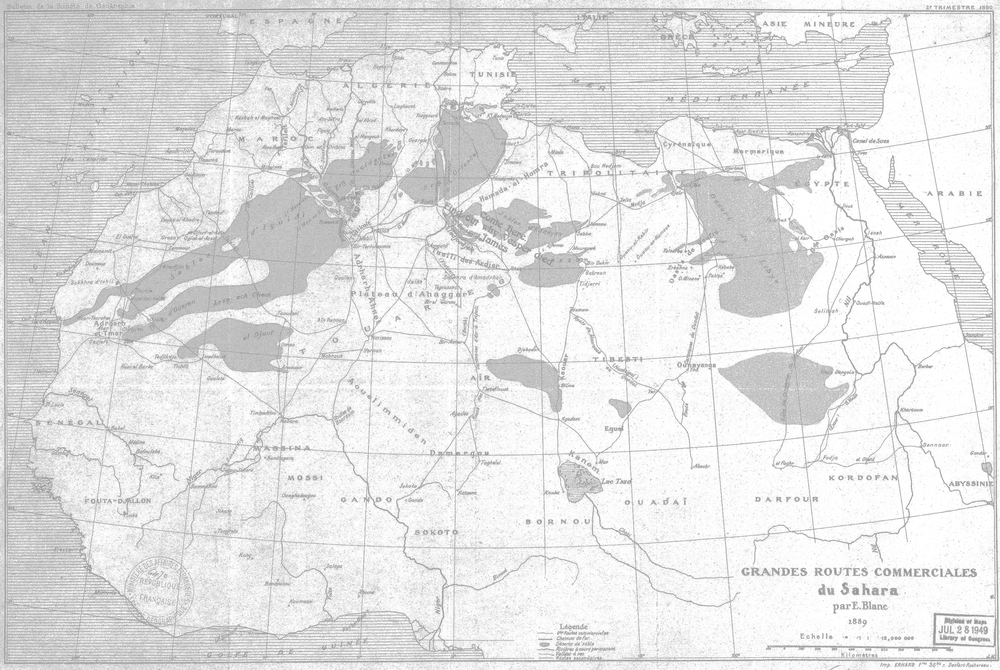

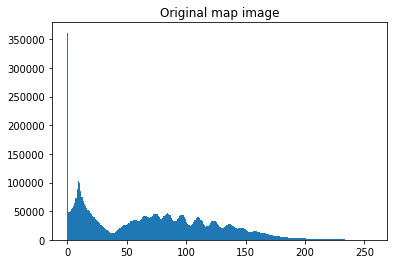

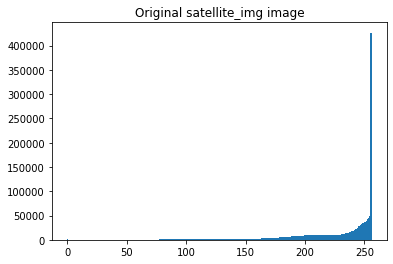

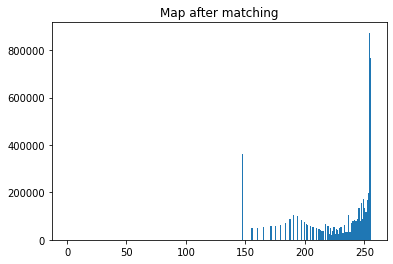

In [172]:
map=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/Map.jpg",0) #input img
satim=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/satellite_img.jpg",0) #spec img
#cdfmap, cdfsat=histGen(map, satim)
#print(cdfmap,'\n', cdfsat)
#maphist = cv2.calcHist([map],[0],None,[256],[0,256])
#sathist = cv2.calcHist([satim],[0],None,[256],[0,256])

def plotHist(im):
  hist=np.zeros(256)
  for i in range(256):
    hist[i]=(im<=i).sum()
  return hist

def histMatching(im1,im2):
  cdfsrc=np.zeros(256,dtype=int)
  cdfref=np.zeros(256,dtype=int)
  for i in range(256):
    cdfsrc[i]= ((im1<=i).sum())
    cdfref[i]= ((im2<=i).sum())
  #generating cdf:
  cdfsrc=cdfsrc*1.0/(im1.shape[0]*im1.shape[1]*1.0)#normalize both cdfs
  cdfref=cdfref*1.0/(im2.shape[0]*im2.shape[1]*1.0)
  cdfsrc=np.floor(255*cdfsrc)
  cdfref=np.floor(255*cdfref)
  #a=np.zeros(256)
  lookup=np.zeros(256)
  #actj=0
  for i in range(256):
    #actmin=np.iinfo(np.int).max
    nearest=np.abs(cdfref-cdfsrc[i]) #calculate distance between the two cdfs
    j=np.where(nearest == nearest.min()) #find indexes of all pts where the distance is minimum
    #print(j[0][0])
    j=np.asarray(j) #convert list to numpy array 
    #print(type(j))  
    asdf=np.abs(j-i) #calculate nearest intensity to original minimum intensity
    #print(type(asdf)) 
    finalindex=asdf.argmin() #find nearest intensity
    #print(type(finalindex))
    lookup[i]=j[0][finalindex] #store both the intensities in a lookup table
  matched=cv2.LUT(im1,lookup) #Lookup operation
  return matched

matchmap=histMatching(map,satim)
cv2_imshow(matchmap)

"""
fig2, sub2=plt.subplots(1,3,figsize=(15,15))
hist1=plotHist(map)
sub2[0].plot(hist1)
sub2[0].set_title("map before matching")

hist2=plotHist(satim)
sub2[1].plot(hist2)
sub2[1].set_title("satellite_img")

hist3=plotHist(matchmap)
sub2[2].plot(hist3)
sub2[2].set_title("map post matching")
"""
plot1=plt.figure(1)
plt.hist(map.ravel(),256,[0,256]) 
plt.title("Original map image")
plot2=plt.figure(2)
plt.hist(satim.ravel(),256,[0,256]) 
plt.title("Original satellite_img image")
plot3=plt.figure(3)
plt.hist(matchmap.ravel(),256,[0,256]) 
plt.title("Map after matching")
plt.show()

#cv2.imwrite('matching.jpg',matchmap)


#QUESTION 7: Piecewise Linear Transform Implementation

-A difference is clearly visible, the text has become very dark in the first image, and in the second it is still visible.

-The higher intensity pixels map to 0 in the first transform. Hence the text is dark

-In second transform, high intensity pizxels map to 255 and so the hwite text is visible.

Text(0.5, 1.0, 'transform used')

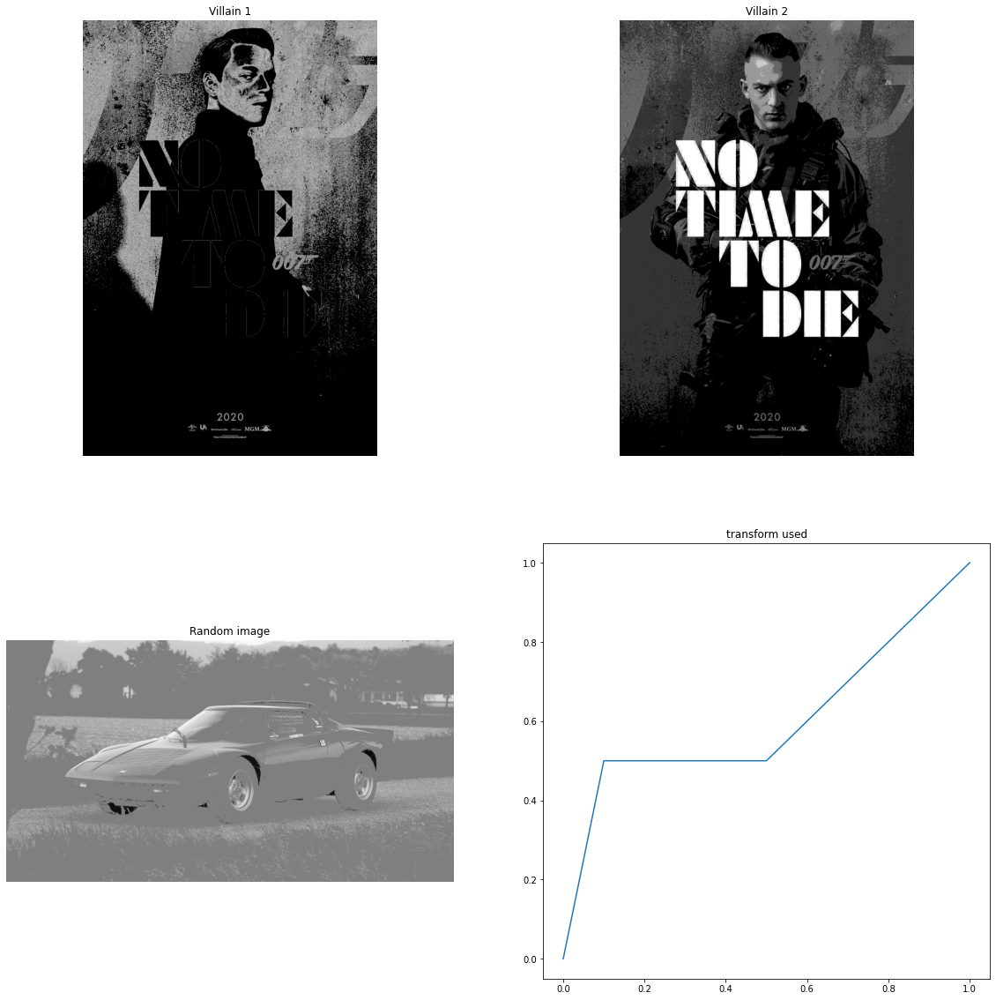

In [173]:
# QUESTION 7
def Transform(im,k1,k2,a,b):
  if (im >= a and im <= b): # >= and <= on both sides 
    im1=k1*im+k2 
  else:
    im1=im #only work on intensities within boundaries
  return im1

bondvillain1=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/bondvillain1.jpg",0)/255
bondvillain2=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/bondvillain2.jpg",0)/255
random=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/9af7c97f-lancia-stratos-stradale-00.jpg",0)/255
#cv2_imshow(random*255)
#image 1
"""
a=[0,0.3,0.6,0.8]
b=[0.3,0.6,0.8,1]
k1=[0,0,0,2.2]
k2=[0,4/3,-2,0]
k1=k1*255
k2=k2*255
"""
piecewiseLinTransform=np.vectorize(Transform)
im1=piecewiseLinTransform(bondvillain1,0,0,0,0.3)
im1=piecewiseLinTransform(im1,4/3,0,0.3,0.6)
im1=piecewiseLinTransform(im1,-2,2,0.6,0.8)
im1=piecewiseLinTransform(im1,0,0,0.8,1)
im1=im1*255
#cv2_imshow(im1*255)

im2=piecewiseLinTransform(bondvillain2,0,0,0,0.2)
im2=piecewiseLinTransform(im2,0,0.2,0.2,0.4)
im2=piecewiseLinTransform(im2,0,0.4,0.4,0.6)
im2=piecewiseLinTransform(im2,0,0.6,0.6,0.8)
im2=piecewiseLinTransform(im2,0,0.8,0.8,254/255)
im2=im2*255
#cv2_imshow(im2*255)

im3=piecewiseLinTransform(random,5,0,0,0.1)
im3=piecewiseLinTransform(im3,0,0.5,0.1,0.5)
im3=piecewiseLinTransform(im3,1,0,0.5,254/255)
im3=im3*255

cv2.imwrite('bond1.jpg',im1*255)
cv2.imwrite('bond2.jpg',im2*255)
cv2.imwrite('random.jpg',im3*255)

fig,sub= plt.subplots(2,2,figsize=(20,20))
sub[0][0].imshow(im1,cmap='gray', vmin=0, vmax=255)
sub[0][0].axis('off')
sub[0][0].set_title("Villain 1")

sub[0][1].imshow(im2, cmap='gray', vmin=0, vmax=255)
sub[0][1].axis('off')
sub[0][1].set_title("Villain 2")

im3=im3.astype(np.uint8)
#im3 = cv2.cvtColor(im3, cv2.COLOR_BGR2RGB)
sub[1][0].imshow(im3,'gray')
sub[1][0].axis('off')
sub[1][0].set_title("Random image")

x=[0,0.1,0.5,1]
y=[0,0.5,0.5,1]
sub[1][1].plot(x, y)
sub[1][1].set_title("transform used")




#QUESTION 8: Gamma Transform Implementation

(-0.5, 1306.5, 787.5, -0.5)

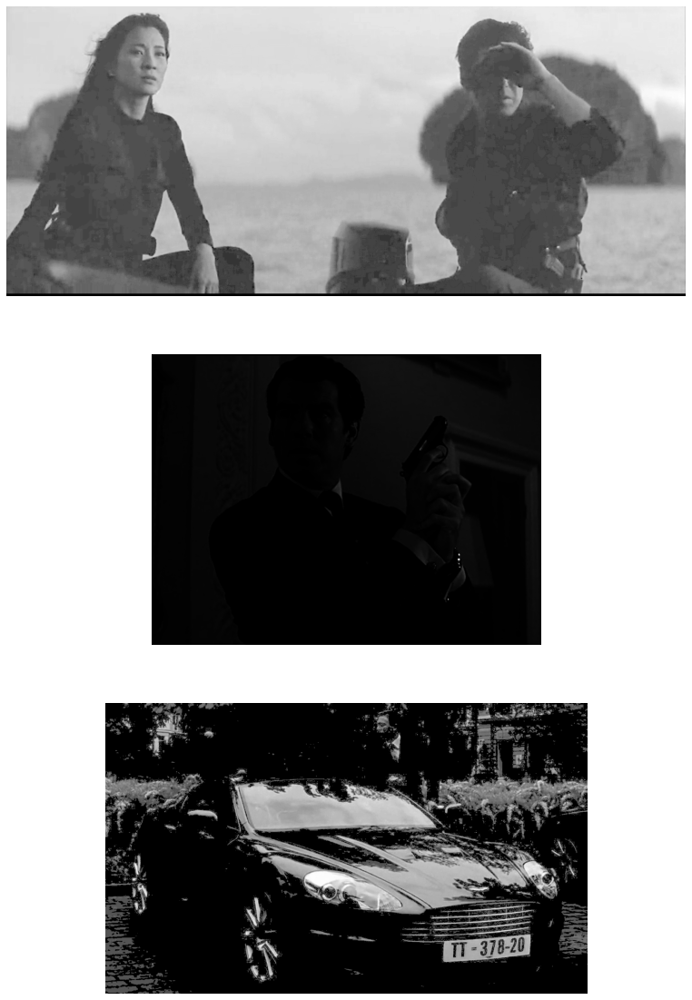

In [174]:
#QUESTION 8
def gammaTransform(im,gamma):
  im1=np.copy(im)
  #im1=im1.astype(np.float64)
  h=im.shape[0]
  w=im.shape[1]
  im1=np.array(255*((im/255)**gamma))
  im1=np.round(im1)
  im1=im1.astype(np.uint8)
  return im1

stealth=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/stealth.png")
stealth = cv2.cvtColor(stealth, cv2.COLOR_BGR2GRAY)
stealthgam=gammaTransform(stealth,0.4)
#GAMMA VALUE USED: 0.4
cv2.imwrite('equalize.jpg',stealthgam)
#cv2_imshow(stealthgam)
#cv2_imshow(stealth)

unstealth=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/unstealth.png")
unstealth = cv2.cvtColor(unstealth, cv2.COLOR_BGR2GRAY)
unstealthgam=gammaTransform(unstealth,3)
#GAMMA VALUE USED: 3
#cv2_imshow(unstealthgam)

aston=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/aston_invisible.jpg")
aston = cv2.cvtColor(aston, cv2.COLOR_BGR2GRAY)
visaston=gammaTransform(aston,0.2)
#GAMMA VALUE USED: 0.2
#cv2_imshow(visaston)

fig,sub= plt.subplots(3,1,figsize=(20,20))
sub[0].imshow(stealthgam,cmap='gray')
sub[0].axis('off')

sub[1].imshow(unstealthgam, cmap='gray', vmin=0, vmax=255)
sub[1].axis('off')

sub[2].imshow(visaston, cmap='gray')
sub[2].axis('off')

#QUESTION 9: Is that the best you got?

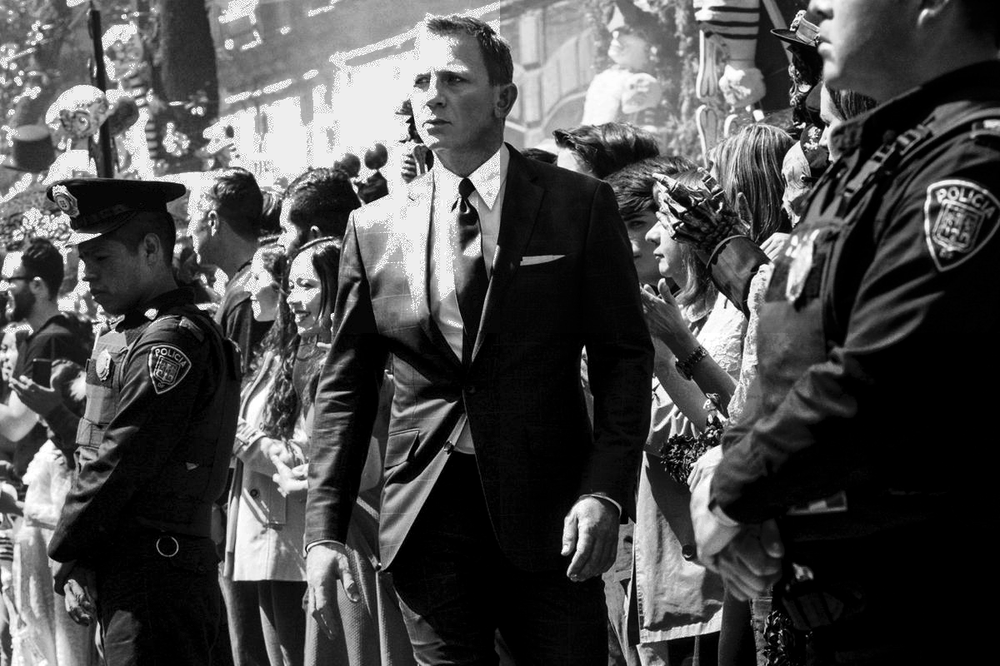

True

In [176]:
#QUESTION 9

def histMatching(im1,im2):
  cdfsrc=np.zeros(256,dtype=int)
  cdfref=np.zeros(256,dtype=int)
  for i in range(256):
    cdfsrc[i]= ((im1<=i).sum())
    cdfref[i]= ((im2<=i).sum())
  #generating cdf:
  cdfsrc=cdfsrc*1.0/(im1.shape[0]*im1.shape[1]*1.0)
  cdfref=cdfref*1.0/(im2.shape[0]*im2.shape[1]*1.0)
  cdfsrc=np.floor(255*cdfsrc)
  cdfref=np.floor(255*cdfref)
  min=0
  a=np.zeros(256)
  lookup=np.zeros(256)
  actj=0
  for i in range(256):
    actmin=np.iinfo(np.int).max
    nearest=np.abs(cdfref-cdfsrc[i])
    j=np.where(nearest == nearest.min())
    #print(j[0][0])
    j=np.asarray(j)
    #print(type(j))
    
    asdf=np.abs(j-i)
    #print(type(asdf))
    finalindex=asdf.argmin()
    #print(type(asdf))
    #print(type(finalindex))
    lookup[i]=j[0][finalindex]
  matched=cv2.LUT(im1,lookup)
  return matched

def gammaTransform(im,gamma):
  im1=np.copy(im)
  #im1=im1.astype(np.float64)
  h=im.shape[0]
  w=im.shape[1]
  im1=np.array(255*((im/255)**gamma))
  im1=np.round(im1)
  im1=im1.astype(np.uint8)
  return im1

def histEqualization(im):
  cdf=np.zeros(256,dtype=int)
  for i in range(256):
    cdf[i]= ((im<=i).sum())
  #generating cdf:
  #cdf=np.cumsum(pdf)
  cdf=cdf*1.0/(im.shape[0]*im.shape[1]*1.0)
  im=im.astype(np.uint8)
  im1=np.copy(im)
  im1 = np.round(255.0 * cdf[im])
  im1=im1.astype(np.uint8)
  return im1





def stitch(im1,im2,im3,im4):
  #since all the images are of the same size, i define a common h,w
  h=im1.shape[0]
  w=im1.shape[1]
  #print(h)
  h1=2*h
  w1=2*w
  im=np.zeros((h1,w1))
  for i in range(h):
    for j in range(w):
      im[i,j]=im1[i,j]
  for i in range(h,h1):
    for j in range(w):
      im[i,j]=im2[i-h,j]
  for i in range(h):
    for j in range(w,w1):
      im[i,j]=im3[i,j-w]
  for i in range(h,h1):
    for j in range(w,w1):
      im[i,j]=im4[i-h,j-w]
  return im


"""
plot1=plt.figure(1)
plt.hist(james1.ravel(),256,[0,256]) 

plot2=plt.figure(2)
plt.hist(james2.ravel(),256,[0,256]) 

plot3=plt.figure(3)
plt.hist(james3.ravel(),256,[0,256]) 

plot4=plt.figure(4)
plt.hist(james4.ravel(),256,[0,256]) 

plt.show()
"""

james1=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/james1.jpg",0)
james2=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/james2.jpg",0)
james3=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/james3.jpg",0)
james4=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/james4.jpg",0)


j1=np.copy(james1)
j2=np.copy(james2)
j3=np.copy(james3)
j4=np.copy(james4)

j1=histEqualization(james1)
#j4=histEqualization(james4)
#j3=histEqualization(james3)

j1=histMatching(j1,james2)
j3=histMatching(j3,james2)
j4=histMatching(j4,james2)
#j1=histEqualization(james1)

"""
j1=gammaTransform(j1,0.6)
j2=gammaTransform(j2,10)
j3=gammaTransform(j3,1.2)
j4=gammaTransform(j4,3)
#j3=histMatching(j3,j4)
"""

j1=gammaTransform(j1,1.12)
j2=gammaTransform(j2,2.1)
j3=gammaTransform(j3,3)
j4=gammaTransform(j4,6.5)

im=stitch(james1,james3,james2,james4)
im1=stitch(j1,j3,j2,j4)
#im1=histEqualization(im1)
#cv2_imshow(im)
cv2_imshow(im1)
cv2.imwrite('awer.jpg',im)
cv2.imwrite('asdf.jpg',im1)